Project 1 - Terrence Cummings
- Crime, Schools, and Home Values in Minneapolis

Read in CSVs from Home Sales and Property Taxes notebooks and perform some analytics

In [20]:
# Dependencies and Setup
import matplotlib as mpl 
import matplotlib.pyplot as plt
import scipy.stats as st
import pandas as pd
import numpy as np
from scipy.stats import linregress
import json
import requests
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn import metrics
from mpl_toolkits.mplot3d import Axes3D
import pingouin as pg
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [26]:
clean_msp_home_sales_df = pd.DataFrame(pd.read_csv('clean_msp_home_sales.csv'))
clean_msp_tax_sales_df = pd.DataFrame(pd.read_csv('clean_msp_tax_sales.csv'))
clean_msp_tax_sales_df['val_abv_sqft']=clean_msp_tax_sales_df['totalvalue']/clean_msp_tax_sales_df['abovegroundarea']
clean_msp_tax_sales_df['val_tot_sqft']=clean_msp_tax_sales_df['totalvalue']/clean_msp_tax_sales_df['totalarea']


##TEST WHETHER AVERAGE HOME VALUE PER SQUARE FOOT IS STATISTICALLY DIFFERENT BETWEEN MINNEAPOLIS COMMUNITIES

CONCLUSION: THE P-VALUE IS PRACTICALLY ZERO SO WE CAN REJECT THE NULL HYPOTHESIS THAT THE MEANS ARE THE SAME, AND ACCEPT THE ALTERNATE HYPOTHESIS THAT THE MEANS ARE DIFFERENT. NOW NEED TO EXPLORE WHY THEY ARE DIFFERENT.

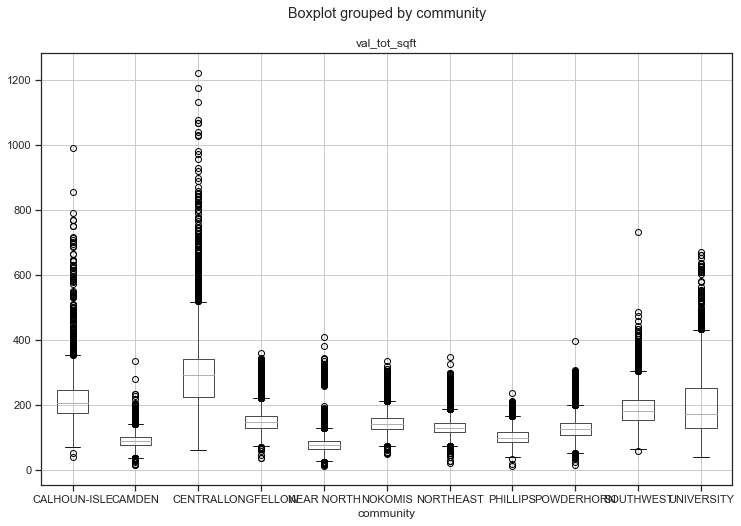

In [27]:
#DO A VISUAL CHECK BASED ON BOXPLOT BY COMMUNITY
clean_msp_tax_sales_df.boxplot('val_tot_sqft', by='community', figsize=(12, 8))


In [50]:

grps = pd.unique(clean_msp_tax_sales_df['community'].values)
d_data = {grp:clean_msp_tax_sales_df['val_tot_sqft'][clean_msp_tax_sales_df['community'] == grp] for grp in grps}

k = len(pd.unique(clean_msp_tax_sales_df['community']))  # number of conditions
N = len(clean_msp_tax_sales_df.values)  # conditions times participants
n = clean_msp_tax_sales_df.groupby('community').size() #Participants in each condition


In [47]:
#DO ONE-WAY ANOVA TEST
F, p = st.f_oneway(d_data['CALHOUN-ISLE'], d_data['CAMDEN'], d_data['CENTRAL'], d_data['LONGFELLOW'], d_data['NEAR NORTH'], d_data['NOKOMIS'], d_data['NORTHEAST'], d_data['PHILLIPS'], d_data['POWDERHORN'], d_data['SOUTHWEST'], d_data['UNIVERSITY'])

print(F, p)

11183.764158386672 0.0


In [36]:
#ANOTHER METHOD FOR ANOVA TEST
mod = ols('val_tot_sqft ~ community', data=clean_msp_tax_sales_df).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
aov_table


,sum_sq,df,F,PR(>F)
community,2.902826e+08,10.0,11183.764158,0.0
Residual,2.415543e+08,93064.0,NaN,NaN


In [51]:
#DO PAIRWISE T-TEST ON EACH COMMUNITY PAIR
pair_t = mod.t_test_pairwise('community')


NOW TEST WHETHER HOME SIZE IS AFFECTS PRICE PER SQUARE FOOT

CONCLUSION: R-SQUARED IS ZERO THEREFORE THERE IS NO RELATIONSHIP BETWEEN HOME SIZE AND PRICE PER SQUARE FOOT. HOME SIZE IS REJECTED AS A CANDIDATE FOR AN INDEPENDENT VARIABLE 

In [52]:
def get_line(x,y,x_name,y_name, incl_regress):
    
    #Initialize the two plats: ax1=scatter, ax2=linear regression line    
    ax1=[]
    ax2=[]
    
    #count the number of cities in the plot to include in the title
    plot_count = x.count()
    
    #Do scatter plot, titel, and labels
    ax1=plt.scatter(x,y)
    ax1=plt.title(f'{plot_count} plots of {y_name} vs. {x_name}')
    ax1=plt.xlabel(f'{x_name}')
    ax1=plt.ylabel(f'{y_name}')
    
    #Include linear regression plot if flag indicates 
    if incl_regress:
        #Perform linear regression and r2 and plot
        slope, intercept, rvalue, pvalue, stderr = st.linregress(x,y)
        r_squared = rvalue**2
        ax2=plt.plot(x, x*slope+intercept, color='red', label= 'Y= '+str(round(slope,2))+'*X + '+str(round(intercept,2))+' R2='+str(round(r_squared,2)))
        #Use legend to show the linear regression equation and R2 value
        ax2=plt.legend()
        
    
    return ax1, ax2

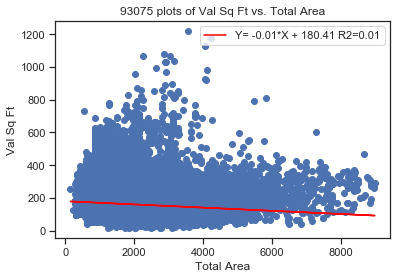

In [53]:
#Plot val_tot_sqft vs totalarea
graph1, graph2 = get_line(clean_msp_tax_sales_df['totalarea'], clean_msp_tax_sales_df['val_tot_sqft'], 'Total Area', 'Val Sq Ft', True)
plt.show()

In [19]:
tax_comm_grp = clean_msp_tax_sales_df.groupby('community')

comm_summary = pd.DataFrame(tax_comm_grp['abovegroundarea'].mean())
comm_summary['belowgroundarea'] = tax_comm_grp['belowgroundarea'].mean()
comm_summary['totalarea'] = tax_comm_grp['totalarea'].mean()
comm_summary['yearbuilt'] = tax_comm_grp['yearbuilt'].mean()
comm_summary['totalvalue'] = tax_comm_grp['totalvalue'].mean()
comm_summary['val_abv_sqft'] = comm_summary['totalvalue']/comm_summary['abovegroundarea']
comm_summary['val_tot_sqft'] = comm_summary['totalvalue']/comm_summary['totalarea']
comm_summary['val_tot_sqft'].mean()

157.26541095785475

In [50]:
Y=clean_msp_tax_sales_df['totalvalue'].astype('float')
X=clean_msp_tax_sales_df[['abovegroundarea', 'bathrooms']].astype('float')

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state= 0)

model = linear_model.LinearRegression()
model.fit(X_train, Y_train)

coeff_df = pd.DataFrame(model.coef_, X.columns, columns=['Coefficient'])
print(model.intercept_)
coeff_df

-117207.28037191246


,Coefficient
abovegroundarea,269.453716
bathrooms,46334.085506


In [51]:
y_pred = model.predict(X_test)

df = pd.DataFrame({'Actual': Y_test, 'Predicted': y_pred})
print(df.head(10))

Actual      Predicted
91628  226500.0  143073.055530
46101  336500.0  359174.935652
46090  339500.0  331139.795580
39470  223500.0  245196.013842
18453  219500.0  263249.412805
62302  386500.0  456435.773456
43780  318500.0  278326.867271
88811  216500.0  219597.910835
52557  561500.0  406035.974967
62624  276500.0  189958.002090


In [52]:
# Root Mean Squared Deviation
rmsd = np.sqrt(mean_squared_error(Y_test, y_pred))      
r2_value = r2_score(Y_test, y_pred)                     

print("Intercept: \n", model.intercept_)
print("Root Mean Square Error \n", rmsd)
print("R^2 Value: \n", r2_value)

Intercept: 
 -117207.28037191246
Root Mean Square Error 
 136753.95881443896
R^2 Value: 
 0.6209353321416182


In [55]:
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(Y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test, y_pred)))

Mean Absolute Error: 88202.14158315955
Mean Squared Error: 18701645251.42127
Root Mean Squared Error: 136753.95881443896
